# COMUNICACION DE RESULTADOS

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sqlalchemy as sa

#Automcompletar rápido
%config IPCompleter.greedy=True

pd.options.display.max_columns = None

con = sa.create_engine('sqlite:///../Datos/airbnb2.db')

df = pd.read_sql('df_preparado', con = con)

#Minicubo:

metricas = ['precio_total', 'precio_compra']
dimensiones = ['bedrooms_disc', 'accommodates_disc', 'beds_disc']

minicubo_precio = df[dimensiones + metricas]

minicubo_precio = minicubo_precio.melt(id_vars = ['precio_total', 'precio_compra'])

minicubo_precio = minicubo_precio.groupby(['variable', 'value'])[['precio_total', 'precio_compra']].agg('mean')

C:\Users\dt_i01626\AppData\Local\Temp\ipykernel_12012\2781767631.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## CONTEXTO DEL ANALISIS

El presente proyecto tiene como objetivo identificar inmuebles, en la Ciudad Autonoma de Buenos Aires (CABA), en los que invertir con el objetivo de obtener rentabilidad mediante alquiler turístico.

Para ello, se presenta un análisis de Discovery que permite identificar estrategias o líneas de trabajo que ayuden a dirigir la actuación del equipo de valoraciones.

## OBJETIVOS

* Analizar las fuentes de datos públicas disponibles
* Para encontrar insights que ayuden a entender las características del mercado en esta ciudad
* Y guíen el trabajo de búsqueda del equipo de valoraciones
* Especialmente en cuanto a los principales ejes: precio del alquiler, niveles de ocupación y precio de compra

## CONCLUSIONES EJECUTIVAS

* Se han localizado 5 barrios en los que centrar la búsqueda
* Se recomienda buscar inmuebles del tipo: monoambiente o con un habitación, que permitan alojar 3 huéspedes
* Se recomienda buscar inmuebles que estando en uno de los barrios identificados no estén necesariamente cerca de puntos de interés
* Se recomienda evaluar el desarrollo de un nuevo producto basado en el alquier por cercania al aeropuerto internacional Ezeiza, especialmente en los barrios de:  Versalles y Villa Real.

## DETALLE DE LOS PRINCIPALES RESULTADOS

### Existen 5 barrios con alto potencial de inversión

* Se han localizado 5 barrios que apriori pueden maximizar la relación coste-ingresos
* Además podemos segmentarlos por el tipo calidad del inmueble en el que nos interes invertir en 3 grandes grupos
* Estos son los 5 barrios donde comenzar a buscar oportunidades concretas:
    * Bajo: Versalles, Villa Real.
    * Medio: Recoleta, Colegiales.
    * Alto: Palermo.

Exhibit 1.4.1

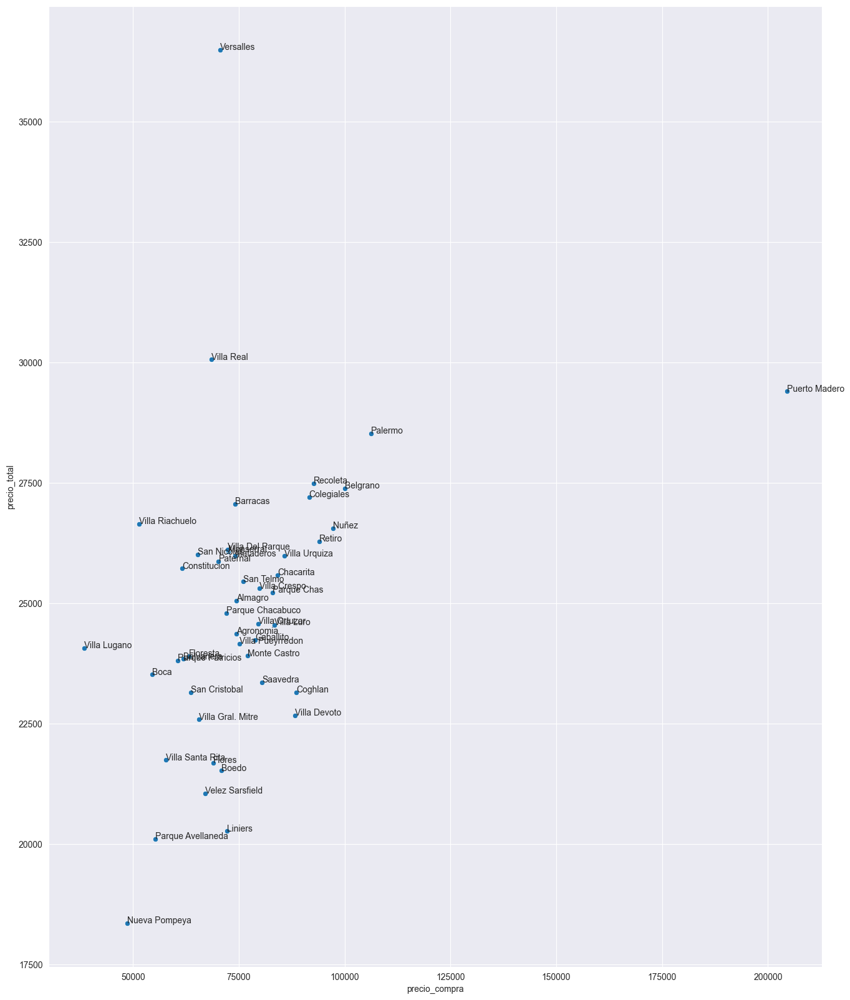

In [3]:
temp = df.groupby('neighbourhood')[['precio_total', 'precio_compra']].mean()

plt.figure(figsize = (16,20))
sns.set_style('darkgrid')
sns.scatterplot(data = temp, x = 'precio_compra', y = 'precio_total')

#Ponemos las etiquetas
for cada in range(0,temp.shape[0]):
    plt.text(temp.precio_compra.iloc[cada], temp.precio_total.iloc[cada], temp.index[cada])

### Buscar inmuebles del tipo: monoambiente o con un habitación, que permitan alojar 3 huéspedes

* El número de huéspedes que maximiza el precio de compra pagado es de 3

Exhibit 1.4.2

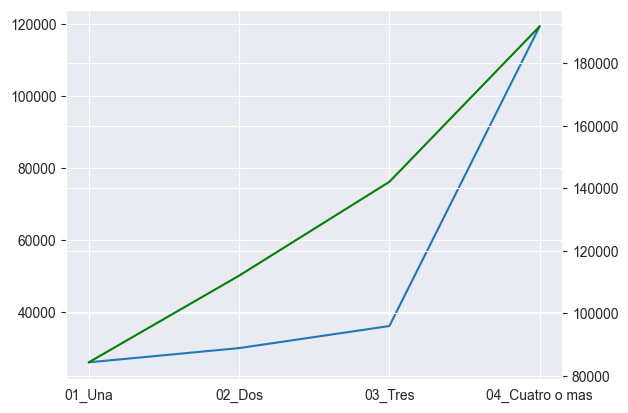

In [4]:
f, ax = plt.subplots()
ax.plot(minicubo_precio.loc['bedrooms_disc'].precio_total)
ax2 = ax.twinx()
ax2.plot(minicubo_precio.loc['bedrooms_disc'].precio_compra, color = 'green');

Se presenta una mejor relación de inversión, rendimiento. En los departamentos de la caracteristicas tipo: monoambiente, loft o con una habitación. Para los departamentos de 2 o más habitaciones el precio de compra (linea verde), es superior al posible ingreso (linea azul) que se puede obtener.

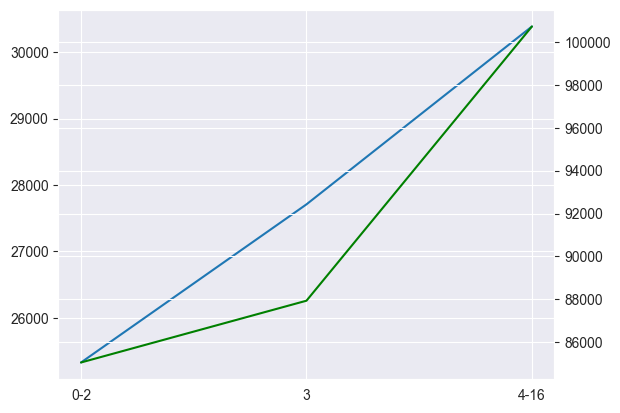

In [5]:
f,ax=plt.subplots()
ax.plot(minicubo_precio.loc['accommodates_disc'].precio_total)
ax2 = ax.twinx()
ax2.plot(minicubo_precio.loc['accommodates_disc'].precio_compra, color = 'green');

El número optimo para albergar huespedes es 3, en departamentos del tipo: monoambient o con una habitación.

### Buscar inmuebles que estando en uno de los barrios identificados no estén necesariamente cerca de puntos de interés

* Previsiblemente tendrán menor precio de compra
* Parece que la cercanía a puntos de interés no tiene un especial impacto sobre el precio del alquiler

Exhibit 1.4.3

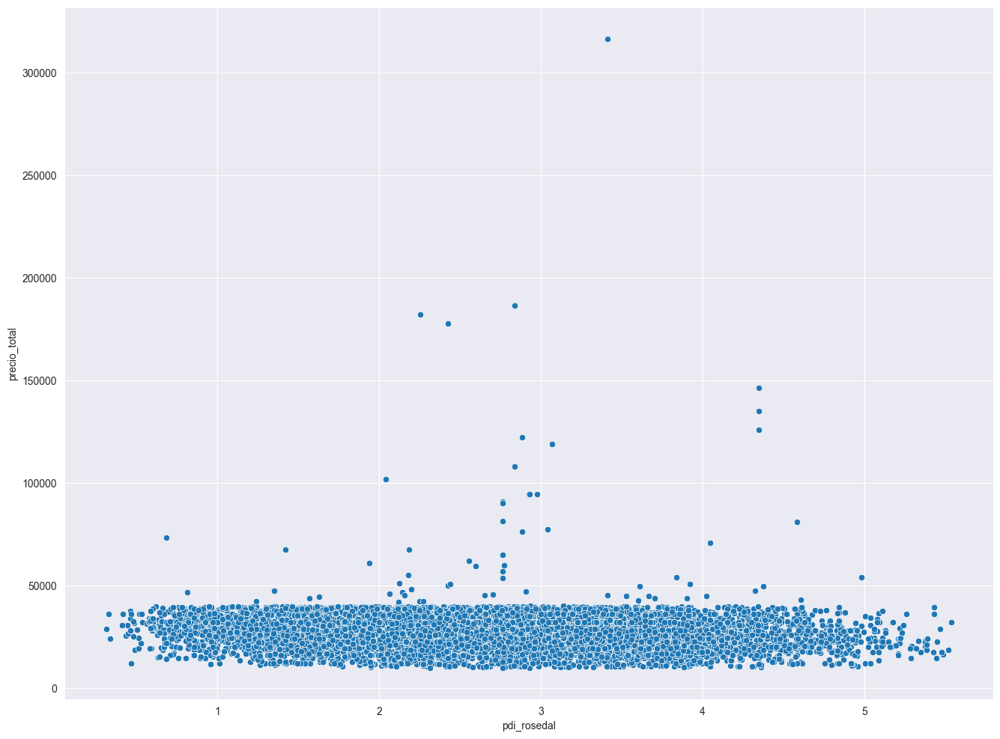

In [7]:
seleccion = df.groupby('neighbourhood').pdi_rosedal.mean().sort_values()[0:7].index.to_list()

plt.figure(figsize = (16,12))
sns.scatterplot(data = df.loc[df.neighbourhood.isin(seleccion)], x = 'pdi_rosedal', y = 'precio_total');

### Evaluar el desarrollo de un nuevo producto basado en el alquier por cercania al aeropuerto internacional Ezeiza.

* Buscar oportunidades en los barrios de Versalles y Villa Real.
* Todavía existen muchos alquileres que no están explotando este potencial

Exhibit 1.4.4

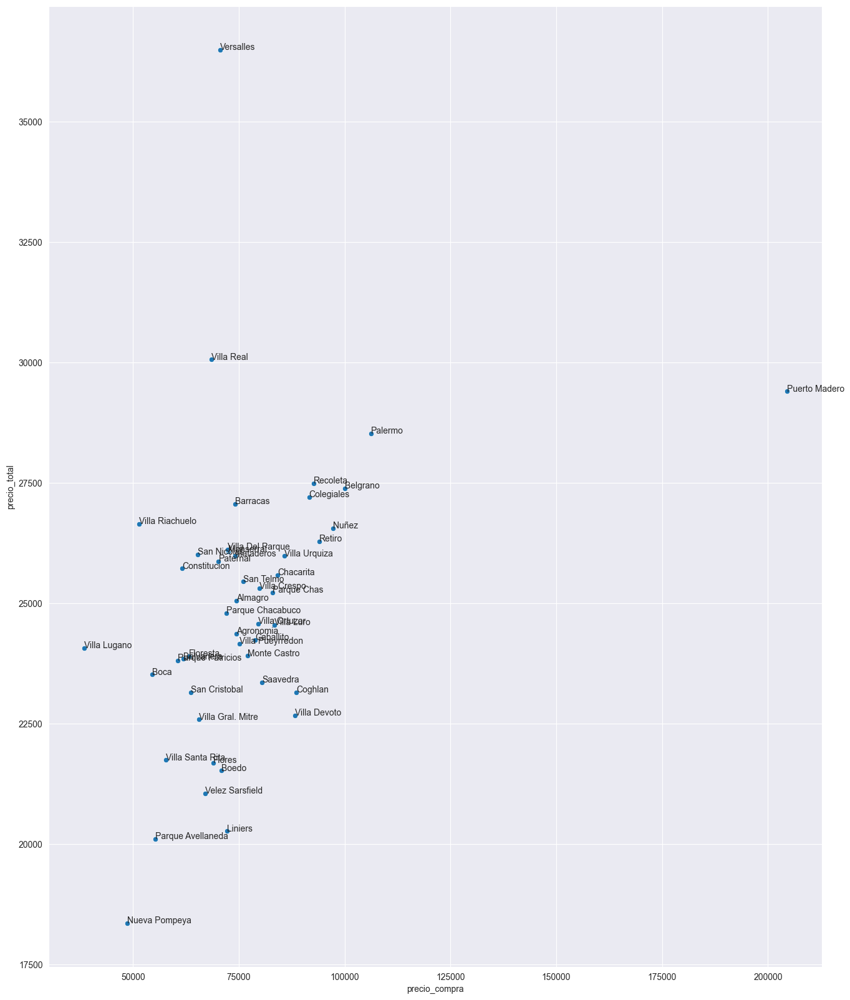

In [8]:
temp = df.groupby('neighbourhood')[['precio_total', 'precio_compra']].mean()

plt.figure(figsize = (16,20))
sns.set_style('darkgrid')
sns.scatterplot(data = temp, x = 'precio_compra', y = 'precio_total')

#Ponemos las etiquetas
for cada in range(0,temp.shape[0]):
    plt.text(temp.precio_compra.iloc[cada], temp.precio_total.iloc[cada], temp.index[cada])

Exhibit 1.4.5

In [24]:
import folium

barrios_seleccionados = ['Versalles', 'Villa Real', 'Palermo', 'Colegiales', 'Recoleta']



datos = df.loc[df.neighbourhood.isin(barrios_seleccionados)].copy()

datos['precio_total_disc'] = pd.qcut(datos['precio_total'], q = [0, .25, .5, .75, 1.], 
                              labels=['yellow', 'orange', 'blue', 'red'])

mapa = folium.Map(location = [-34.60003, -58.47275], zoom_start = 12)

for piso in range(0,len(datos)):
   folium.CircleMarker(
      location = [datos.iloc[piso]['latitude'], datos.iloc[piso]['longitude']],
      popup = datos.iloc[piso]['precio_total'],
      fill=True,
      color = datos.iloc[piso]['precio_total_disc'],
      fill_opacity=1,
      radius = 5
   ).add_to(mapa)

mapa